## Environment

In [1]:
!pip install gym[mujoco]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 9.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.8/211.8 kB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 35.5 MB/s eta 0:00:00ta 0:00:01


In [2]:
import gym

sample_env = gym.make('Ant-v4')

The environment we are working with is a 3D four-legged ant, whose goal is to cover the maximum distance in the positive direction of the x-coordinate in the shortest possible time. Additionally, the ant must remain in a 'healthy condition,' meaning its body must stay within the z-coordinate boundaries (0.2, 1). This automatically rules out the possibility of jumping. Therefore, the task is to teach the ant to move quickly (walk/run). Before diving into the task, it would be better if we first study the environment. To do this, let's explore what actions the ant can take and what information it receives from the environment.

In [3]:
print(sample_env.observation_space)

Box(-inf, inf, (27,), float64)


As we can see, the information provided to the ant from the environment is not that large. Practically, it has to manage the given task with the knowledge of 27 float64 values. These 27 numbers describe the height of the ant's body, its orientation relative to the ground, the orientation of each leg and joint, as well as their speeds. Since the observation space is not that large (it's not an image containing hundreds of pixels, for instance), we believe that preprocessing it is not necessary.

In [4]:
print(sample_env.action_space)

Box(-1.0, 1.0, (8,), float32)


As we can see, the ant controls 8 joints located on its body. Each pair of these 8 joints is responsible for one leg. The range (-1, 1) represents the torque that the ant can apply to a particular joint to generate a certain push. It's important to note that the range (-1, 1) is continuous, which immediately tells us that algorithms like DQN and DDQN are not suitable for solving this task.

In [5]:
print(sample_env.reset())

(array([ 0.77311965,  0.99862418,  0.05164823,  0.00870666,  0.00252813,
        0.08492735,  0.01080124, -0.00848363,  0.08868658, -0.00799394,
       -0.09016186,  0.01200344, -0.01108296, -0.12528841,  0.05198144,
        0.1163352 , -0.02382389, -0.13532876,  0.11427818,  0.09321205,
       -0.02782993,  0.09430379,  0.05021797, -0.01744864,  0.11167226,
       -0.00423712,  0.20985012]), {})


An interesting point here is that the reset() function, besides returning the standard observed state, also returns an empty dictionary, which is useless for our task. We believe that this dictionary previously contained the 'contact forces' parameters, meaning the reaction forces generated between the ant's legs and the ground, hypothetically. However, it is mentioned in the documentation that with the release of v4, issues related to these forces have been resolved. We suspect they simply removed them, as neither observation_space.shape nor other commands confirm their existence. Therefore, when we later call the reset method, we will use it as reset()[0], since we only need the 27 float64 values.

## Choosing the algorithm

Initially, to begin solving the task, it was necessary to agree on a specific algorithm. To do this, we researched well-known algorithms that perform well in tasks with continuous action spaces and decided to see how well each algorithm would perform with short-term training. For testing, we selected SAC, TD3, A2C, PPO, and DDPG. Since we had no prior experience with any of these algorithms, we simply used the implementations provided by the stable_baselines3 library. We ran each with fixed timesteps, then rendered the trained model and evaluated which algorithm was more suitable for our task.

In [6]:
TIMESTEPS = 500
TEST_EPISODES = 100

#### SAC

In [ ]:
from stable_baselines3 import SAC

sac_env = gym.make('Ant-v4')
model = SAC('MlpPolicy', sac_env, device='cpu')

cnt = 0
while cnt < TEST_EPISODES:
    cnt += 1
    model.learn(total_timesteps=TIMESTEPS, reset_num_timesteps=False)

sac_env_test = gym.make('Ant-v4', render_mode='human')

obs = sac_env_test.reset()[0]
done = False
while not done:
    action, _ = model.predict(obs)
    obs, _, done, _, _ = sac_env_test.step(action)

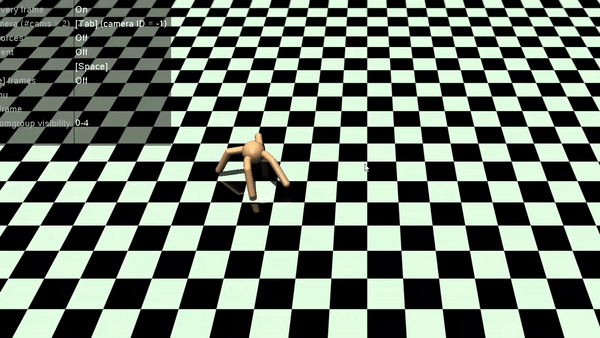

#### TD3

In [ ]:
from stable_baselines3 import TD3

td3_env = gym.make('Ant-v4')
model = TD3('MlpPolicy', td3_env, device='cpu')

cnt = 0
while cnt < TEST_EPISODES:
    cnt += 1
    model.learn(total_timesteps=TIMESTEPS, reset_num_timesteps=False)

td3_env_test = gym.make('Ant-v4', render_mode='human')

obs = td3_env_test.reset()[0]
done = False
while not done:
    action, _ = model.predict(obs)
    obs, _, done, _, _ = td3_env_test.step(action)

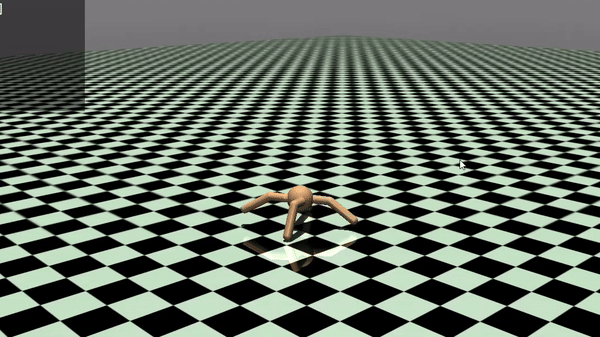

#### DDPG

In [ ]:
from stable_baselines3 import DDPG

ddpg_env = gym.make('Ant-v4')
model = DDPG('MlpPolicy', ddpg_env, device='cpu')

cnt = 0
while cnt < TEST_EPISODES:
    cnt += 1
    model.learn(total_timesteps=TIMESTEPS, reset_num_timesteps=False)

ddpg_env_test = gym.make('Ant-v4', render_mode='human')

obs = ddpg_env_test.reset()[0]
done = False
while not done:
    action, _ = model.predict(obs)
    obs, _, done, _, _ = ddpg_env_test.step(action)

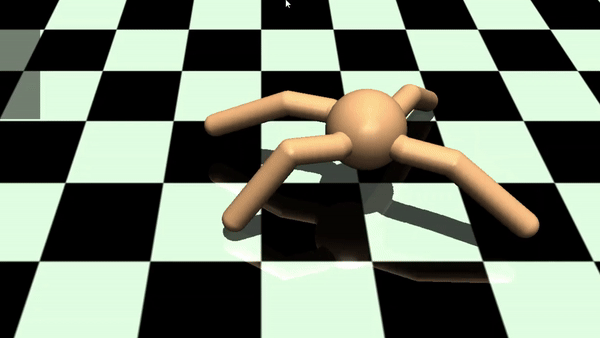

#### A2C

In [ ]:
from stable_baselines3 import A2C

a2c_env = gym.make('Ant-v4')
model = A2C('MlpPolicy', a2c_env, device='cpu')

cnt = 0
while cnt < TEST_EPISODES:
    cnt += 1
    model.learn(total_timesteps=TIMESTEPS, reset_num_timesteps=False)

a2c_env_test = gym.make('Ant-v4', render_mode='human')

obs = a2c_env_test.reset()[0]
done = False
while not done:
    action, _ = model.predict(obs)
    obs, _, done, _, _ = a2c_env_test.step(action)

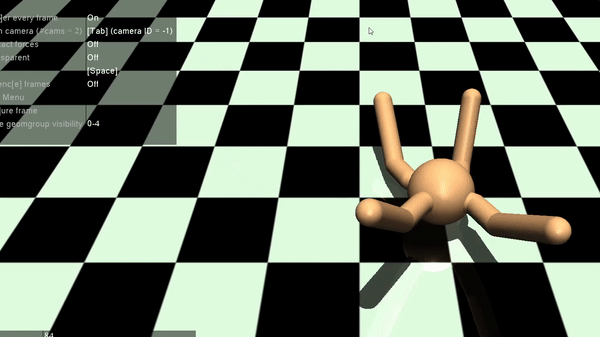

#### PPO

In [ ]:
from stable_baselines3 import PPO

ppo_env = gym.make('Ant-v4')
model = PPO('MlpPolicy', ppo_env, device='cpu')

cnt = 0
while cnt < TEST_EPISODES:
    cnt += 1
    model.learn(total_timesteps=TIMESTEPS, reset_num_timesteps=False)

ppo_env_test = gym.make('Ant-v4', render_mode='human')

obs = ppo_env_test.reset()[0]
done = False
while not done:
    action, _ = model.predict(obs)
    obs, _, done, _, _ = ppo_env_test.step(action)

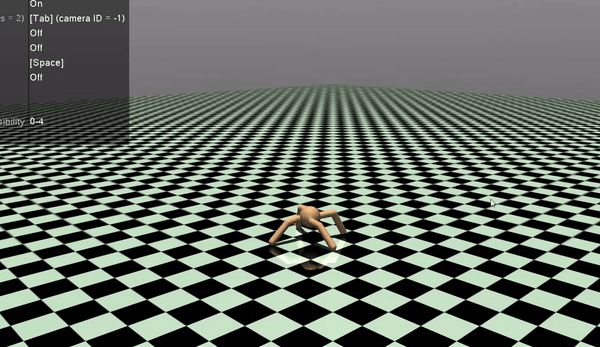

Indeed, the values for TIMESTEP and TEST_EPISODES were insufficiently large, such that when we observed the results of these 5 videos at runtime, they were almost indistinguishable from the scores accumulated by absolute random movement. Nevertheless, we decided to trust the knowledge accumulated in the short period. Moreover, our attention was drawn to the TD3 run, where the ant seemed to move in a straight line from the initial position in a certain direction. This is probably largely due to the effectiveness of the algorithm, so we decided to solve the task using the TD3 algorithm.

## Model - Twin Delayed Deep Deterministic Policy Gradient (TD3)

TD3, like DDPG, is an actor-critic algorithm. This means that the model has two types of neural networks: an actor network and a critic network. The actor network is responsible for selecting the best actions (this selection is deterministic, meaning the neural network returns not probabilities to choose an action but a specific action), while the critic network evaluates the action, specifically returning the Q-value, which represents the future reward for performing that action. Unlike DDPG, TD3 uses two critic networks simultaneously. This choice is aimed at reducing overestimation. Specifically, DDPG uses a maximization function for action selection, which is risky in situations where a specific state-action pair is assigned a higher Q-value than it should realistically have. To balance this, TD3 takes the minimum Q-value from the two critic networks' outputs and uses that to evaluate the Q-value. This improves the algorithm's stability. Similar to other well-known algorithms, like DDQN, TD3 also employs target networks that update more slowly, acting as a form of 'anchor' to prevent the overfitting of the actor and critic networks used in TD3. Additionally, there is a replay buffer that stores observations captured by the model, keeps them, and later updates the necessary neural networks using randomly selected subsets from it. The replay buffer aims to eliminate correlations caused by the sequence of frames.

torch version 2.2.0 is required.

In [7]:
import numpy as np
import torch as T
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
import os

#### Replay Buffer

The simplest in terms of functionality and implementation is the replay buffer. Its task is to store specific observations and later select a subset of a certain size.

In [8]:
MAX_BUF_SIZE            = 1000000
OBSERVATION_SHAPE       = sample_env.observation_space.shape[0]
ACTION_SHAPE            = sample_env.action_space.shape[0]

In [9]:
class ReplayBuffer:
    def __init__(self, max_buffer_size=MAX_BUF_SIZE, observation_shape=OBSERVATION_SHAPE, action_shape=ACTION_SHAPE):
        self.mem_size = max_buffer_size
        self.mem_cnt = 0

        self.states = np.zeros((self.mem_size, observation_shape))      #intial state
        self.new_states = np.zeros((self.mem_size, observation_shape))  #last state
        self.actions = np.zeros((self.mem_size, action_shape))          #action
        self.rewards = np.zeros(self.mem_size)                          #reward
        self.terminals = np.zeros(self.mem_size, dtype=np.bool_)        #terminal or not

    def add_experience(self, state, action, reward, new_state, done):
        index = self.mem_cnt % self.mem_size

        self.states[index] = state
        self.new_states[index] = new_state
        self.terminals[index] = done
        self.rewards[index] = reward
        self.actions[index] = action

        self.mem_cnt += 1

    def sample_batch(self, batch_size):
        max_mem = min(self.mem_cnt, self.mem_size)

        batch = np.random.choice(max_mem, batch_size)

        return self.states[batch], self.actions[batch], self.rewards[batch], self.new_states[batch], self.terminals[batch]

#### Critic Network

As already mentioned, the critic network is a neural network whose goal is to evaluate a given state-action pair. Its learning rate is generally slightly higher than that of the actor network, so we typically introduce separate alpha and beta learning rates for them. Since the purpose of this network is to evaluate a state-action pair with a single Q-value, its input layer size is observation_shape + action_shape, while the output layer is of size 1, as it returns a single Q-value. By default, we use 2 hidden layers interconnected with ReLU activation functions. In short, we build a simple neural network. The only difference will be that we will add save and load functions to the critic network. This will be necessary to save a sufficiently well-trained model so that we can load and test this model later if needed. To add this functionality, we need name and checkpoint_dir variables to allow us to save both the standard and target networks in a specific directory.

In [10]:
BETA                    = 0.001
LAYER1                  = 400
LAYER2                  = 300
RANDOM_NAME             = 'no_name'
CHECK_DIR               = 'td3'

In [11]:
class CriticNetwork(nn.Module):
    def __init__(self, beta=BETA, observation_shape=OBSERVATION_SHAPE, layer1_dim=LAYER1, layer2_dim=LAYER2, action_shape=ACTION_SHAPE, name=RANDOM_NAME, checkpoint_dir=CHECK_DIR):
        super(CriticNetwork, self).__init__()
        self.checkpoint_file = os.path.join(checkpoint_dir, name)

        self.layer1 = nn.Linear(observation_shape + action_shape, layer1_dim)
        self.layer2 = nn.Linear(layer1_dim, layer2_dim)
        self.q1 = nn.Linear(layer2_dim, 1)

        self.optimizer = optim.Adam(self.parameters(), lr=beta)
        self.device = T.device('cuda:0' if T.cuda.is_available() else 'cpu')

        self.to(self.device)

    def forward(self, state, action):
        q1_action_value = self.layer1(T.cat([state, action], dim=1))
        q1_action_value = F.relu(q1_action_value)
        q1_action_value = self.layer2(q1_action_value)
        q1_action_value = F.relu(q1_action_value)

        q1 = self.q1(q1_action_value)

        return q1

    def save_checkpoint(self):
        print('... saving checkpoint ...')
        T.save(self.state_dict(), self.checkpoint_file)

    def load_checkpoint(self):
        print('... loading checkpoint ...')
        self.load_state_dict(T.load(self.checkpoint_file))

#### Actor Network

The purpose of the actor network is to return the best action based on the information received from the environment. Since the environment's size is observation_space, and the action is represented by action_space with a float32, the sizes of the input and output layers of this network are clear. Similar to the critic network, we use 2 hidden layers with ReLU activation functions. The only difference is that, for generating the output, we also use the tanh function, which maps the range from (-inf, inf) to (-1, 1), matching the range of our actions. Like the critic network, the actor network also has save and load methods.

In [12]:
ALPHA                   = 0.001

In [13]:
class ActorNetwork(nn.Module):
    def __init__(self, alpha=ALPHA, observation_shape=OBSERVATION_SHAPE, layer1_dim=LAYER1, layer2_dim=LAYER2, action_shape=ACTION_SHAPE, name=RANDOM_NAME, checkpoint_dir=CHECK_DIR):
        super(ActorNetwork, self).__init__()
        self.checkpoint_file = os.path.join(checkpoint_dir, name)

        self.layer1 = nn.Linear(observation_shape, layer1_dim)
        self.layer2 = nn.Linear(layer1_dim, layer2_dim)
        self.mu = nn.Linear(layer2_dim, action_shape)

        self.optimizer = optim.Adam(self.parameters(), lr=alpha)
        self.device = T.device('cuda:0' if T.cuda.is_available() else 'cpu')

        self.to(self.device)

    def forward(self, state):
        prob = self.layer1(state)
        prob = F.relu(prob)
        prob = self.layer2(prob)
        prob = F.relu(prob)

        mu = T.tanh(self.mu(prob))

        return mu

    def save_checkpoint(self):
        print('... saving checkpoint ...')
        T.save(self.state_dict(), self.checkpoint_file)

    def load_checkpoint(self):
        print('... loading checkpoint ...')
        self.load_state_dict(T.load(self.checkpoint_file))

#### Agent

The agent is an object that combines the previously implemented components and includes functionality for learning and saving. It contains an actor network and two critic networks with their corresponding target networks. It has a network parameters update function, where each network is updated using a 'soft' update through the tau parameter. Until the model reaches xp_time, exploration is conducted through completely random actions. Once some knowledge is accumulated, the agent uses neural networks for action selection. However, to avoid pure exploitation, similar to the epsilon-greedy approach used in DQN, we use 'noise' which slightly alters the predictions, performs smoothing, and after adding the noise, the action is 'clamped' to ensure it remains within valid bounds. The batch_to_device function is necessary to convert the sampled experience into tensors and transfer them to the device, which is the CPU by default (but will be the GPU if available).

As for training the model, we first use the idea of minimizing the loss function, which is the difference between the predicted Q-value and the target Q-value. This is computed using the formula:

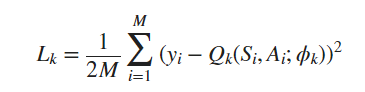 

By minimizing this, we update the critic networks at each step. First, based on the state, we get possible actions from the target_actor neural network. Then, we apply "smoothing" with the addition of noise, and subsequently, we clamp the action within valid intervals. Through this, both target_critics return Q1' and Q2' values. Here, we consider that if we are in a terminal state, then the q_value should be 0, and we also adjust dimensions accordingly. Afterward, we take the minimum of the values returned by these two networks (to avoid overestimation) and compute the target (i.e., y = reward + gamma * Q'). Next, we compute the actual q-values returned by the critic networks. The q-values and target are used to update the critic networks (the loss function is computed as their difference). First, we reset both critic optimizers to their initial states, then compute the critic_loss for each network by calculating the losses, perform backpropagation, and update both networks.

On the other hand, we update the actor network after each update_interval (for smoother learning) through policy gradients, based on the idea of maximizing rewards. This means that the actor network is updated to choose the action favored by the critic. Initially, its optimizer is started, then we compute the q-value (from one of the critic networks) and calculate the loss using the mean function. Notably, the negative sign indicates that we are aiming to maximize the expected q-value; a positive sign would be needed for minimization.

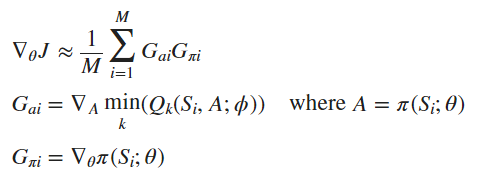


In [14]:
TAU = 0.005
GAMMA = 0.99
UPDATE_INT = 2
XP = 1000
BATCH = 100
NOISE = 0.1
ACT_MAX = sample_env.action_space.high
ACT_MIN = sample_env.action_space.low

In [ ]:
class Agent:
    def __init__(self, tau=TAU, max_action=ACT_MAX, min_action=ACT_MIN,
                 gamma=GAMMA, update_interval=UPDATE_INT, xp_time=XP,
                 action_shape=ACTION_SHAPE, batch_size=BATCH, noise=NOISE):
        self.gamma = gamma
        self.tau = tau
        self.noise = noise
        self.buffer = ReplayBuffer()
        self.batch_size = batch_size

        self.actor = ActorNetwork(name='actor')
        self.target_actor = ActorNetwork(name='target_actor')
        self.critic_1 = CriticNetwork(name='critic_1')
        self.critic_2 = CriticNetwork(name='critic_2')
        self.target_critic_1 = CriticNetwork(name='target_critic_1')
        self.target_critic_2 = CriticNetwork(name='target_critic_2')

        self.xp_time = xp_time
        self.action_shape = action_shape
        self.update_interval = update_interval
        self.max_action = max_action
        self.min_action = min_action
        self.learn_step_cnt = 0
        self.time_step = 0

        self.update_network_parameters(tau=1)

    def get_action(self, state):
        if self.time_step >= self.xp_time:
            action = self.actor.forward(T.tensor(state, dtype=T.float).to(self.actor.device)).to(self.actor.device)
        else:
            action = T.tensor(np.random.normal(scale=self.noise, size=(self.action_shape,)))

        if self.xp_time != 0:
            action = action + T.tensor(np.random.normal(scale=self.noise), dtype=T.float).to(self.actor.device)

        action = T.clamp(action, self.min_action[0], self.max_action[0])
        self.time_step += 1

        return action.cpu().detach().numpy()

    def store_xp(self, state, action, reward, new_state, done):
        self.buffer.add_experience(state, action, reward, new_state, done)

    def batch_to_device(self, batch):
        state = T.tensor(batch[0], dtype=T.float).to(self.critic_1.device)
        action = T.tensor(batch[1], dtype=T.float).to(self.critic_1.device)
        reward = T.tensor(batch[2], dtype=T.float).to(self.critic_1.device)
        new_state = T.tensor(batch[3], dtype=T.float).to(self.critic_1.device)
        done = T.tensor(batch[4]).to(self.critic_1.device)

        return state, action, reward, new_state, done

    def update_critics(self, target, q1_val, q2_val):
        self.critic_1.optimizer.zero_grad()
        self.critic_2.optimizer.zero_grad()

        q1_loss = F.mse_loss(target, q1_val)
        q2_loss = F.mse_loss(target, q2_val)
        critic_loss = q1_loss + q2_loss
        critic_loss.backward()
        self.critic_1.optimizer.step()
        self.critic_2.optimizer.step()

    def update_actor(self, state):
        self.actor.optimizer.zero_grad()
        actor_q1_loss = self.critic_1.forward(state, self.actor.forward(state))
        actor_loss = -T.mean(actor_q1_loss)
        actor_loss.backward()
        self.actor.optimizer.step()
        self.update_network_parameters()

    def learn(self):
        if self.buffer.mem_cnt < self.batch_size:
            return
        state, action, reward, new_state, done = self.batch_to_device(self.buffer.sample_batch(self.batch_size))
        target_actions = (self.target_actor.forward(new_state) +
                          T.clamp(T.tensor(np.random.normal(scale=0.2)), -0.5, 0.5))
        target_actions = T.clamp(target_actions, self.min_action[0], self.max_action[0])

        new_q1_val = self.target_critic_1.forward(new_state, target_actions)
        new_q2_val = self.target_critic_2.forward(new_state, target_actions)

        q1_val = self.critic_1.forward(state, action)
        q2_val = self.critic_2.forward(state, action)

        new_q1_val[done] = 0.0
        new_q1_val = new_q1_val.view(-1)
        new_q2_val[done] = 0.0
        new_q2_val = new_q2_val.view(-1)

        min_q_val = T.min(new_q1_val, new_q2_val)

        target = reward + self.gamma * min_q_val
        target = target.view(self.batch_size, 1)

        self.update_critics(target, q1_val, q2_val)
        self.learn_step_cnt += 1

        if self.learn_step_cnt % self.update_interval == 0:
            self.update_actor(state)

    def update_network_parameters(self, tau=None):
        if tau is None:
            tau = self.tau

        actor_params = dict(self.actor.named_parameters())
        target_actor_params = dict(self.target_actor.named_parameters())
        critic_1_params = dict(self.critic_1.named_parameters())
        critic_2_params = dict(self.critic_2.named_parameters())
        target_critic_1_params = dict(self.target_critic_1.named_parameters())
        target_critic_2_params = dict(self.target_critic_2.named_parameters())

        for name in critic_1_params:
            critic_1_params[name] = (tau * critic_1_params.get(name).clone() +
                                     (1 - tau) * target_critic_1_params.get(name).clone())
        for name in critic_2_params:
            critic_2_params[name] = (tau * critic_2_params.get(name).clone() +
                                     (1 - tau) * target_critic_2_params.get(name).clone())
        for name in actor_params:
            actor_params[name] = (tau * actor_params.get(name).clone() +
                                  (1 - tau) * target_actor_params.get(name).clone())

        self.target_critic_1.load_state_dict(critic_1_params)
        self.target_critic_2.load_state_dict(critic_2_params)
        self.target_actor.load_state_dict(actor_params)

    def save_models(self):
        self.actor.save_checkpoint()
        self.target_actor.save_checkpoint()
        self.critic_1.save_checkpoint()
        self.critic_2.save_checkpoint()
        self.target_critic_1.save_checkpoint()
        self.target_critic_2.save_checkpoint()

    def load_models(self):
        self.actor.load_checkpoint()
        self.target_actor.load_checkpoint()
        self.critic_1.load_checkpoint()
        self.critic_2.load_checkpoint()
        self.target_critic_1.load_checkpoint()
        self.target_critic_2.load_checkpoint()

## Side Note

All the results and executions you see at the bottom of the notebook, as well as the frames from the GIFs above, were run in a Python 3.11 project in PyCharm. Before writing the correct implementation of the algorithm, we figured out how to train and later test it, and for convenience, we did those stages in PyCharm. We did not run the training part in this notebook because we had the weights of the trained models saved from the PyCharm project, and we also saved the graphs of the fine-tuned models. The entire process took 15 hours on each computer, so to save time, we directly reflected the results here.

## Training

It’s time to move on to the training phase. To train our model, we need to run it for around 1000 episodes and save the score accumulated by the model at each episode. The goal of this is to have the scores stored for each episode so that after the training is complete, we can use them to plot a learning curve. However, instead of plotting the raw scores directly on this plot, we decided to display the moving average of the last 100 episodes, as this is a more common practice for creating smoother and more interpretable graphs. Additionally, by knowing the average of the last 100 scores, we can always determine what score the model achieved in each episode.

In [ ]:
EPISODE_NUM = 1000
PLOT_PATH = 'plots/' + 'Ant_' + str(EPISODE_NUM) + '.png'

#### Single Episode

At the beginning of each episode, the environment (env) must be reset to its initial position so that the model can start working from there. The variables done and truncate inform the model when to stop, while single_score records the result of this specific episode. When the model is running, it selects the best action corresponding to the current state/observation and moves based on this principle. In return, the environment provides information about the new state and a reward, which the model stores in the replay buffer, and uses to learn new patterns. Ultimately, single_score increases by the amount of the returned reward, and the current state becomes the new state, and so on.

In [ ]:
def single_episode(train_agent, train_env):
    observation = train_env.reset()[0]
    done = False
    truncate = False
    single_score = 0
    while not done and not truncate:
        action = train_agent.get_action(observation)
        new_observation, reward, done, truncate, info = train_env.step(action)
        train_agent.store_xp(observation, action, reward, new_observation, done)
        train_agent.learn()
        single_score += reward
        observation = new_observation

    return single_score

#### Actual Training

The goal of this method is to run EPISODE_NUM (in our case, 1000) single_episodes for a specific model created by the train method. Additionally, each episode’s score is stored in the score_history list, which will later be used for plotting. It’s important to note the save_model argument, which is set to False by default. However, if we want to save the model at the end of training for later visualization, we simply pass save_model=True. In such a case, the train_agent will call the save_models() method, which we discussed earlier, and the purpose of this method is to save the weights and parameters of all six neural networks in the model. We will use all of this later during testing.

In [ ]:
def train(save_model=False):
    train_env = gym.make('Ant-v4')
    train_agent = Agent()
    score_history = []

    for episode in range(EPISODE_NUM):
        single_score = single_episode(train_agent, train_env)

        score_history.append(single_score)

        print('episode ', episode, 'score %.1f' % single_score)

    if save_model:
        train_agent.save_models()

    return score_history

#### Plotting

As we already mentioned, the goal of plotting is to show the model's learning curve, where the moving average of the last 100 scores will be displayed according to the episodes.

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
def plot(score_history):
    episode_numeration = []
    for i in range(EPISODE_NUM):
        episode_numeration.append(i + 1)

    running_avg = np.zeros(len(score_history))
    for i in range(len(running_avg)):
        running_avg[i] = np.mean(score_history[max(0, i - 100):(i + 1)])

    plt.plot(episode_numeration, running_avg)
    plt.title('ბოლო 100 ეპიზოდის საშუალო ქულა')
    plt.savefig(PLOT_PATH)

Now, let’s run the training for 1000 episodes, save the model's weights, and also plot the corresponding learning curve.

In [ ]:
plot(train(save_model=True))

![image.png](attachment:image.png)

The learning curve obtained from the first run appears somewhat chaotic in certain areas. However, each drop can be explained by the fact that in some episodes, the model suddenly received a negative single_score. This is caused by the additional noise present in our algorithm. In just two out of 1000 episodes, it happened that the additional noise affected each joint simultaneously (meaning that if the noise on one joint tried to steer the ant in the opposite direction, it happened for most joints as well), leading to an episode with a score of -1500 appearing suddenly among episodes with scores of 2100-2200. This explains the sharp drops around episodes 500 and 700. Other than that, the learning curve shows a fairly good upward trend.

We also want to highlight the dip between the 0th and 1st episodes. This was consistently observed in every run, and the explanation is quite simple: in the 0th episode, the model has not yet accumulated enough XP experience, so it performs random movements at that time to fill the replay buffer. Afterward, the neural networks begin to be used, although their weights are initially set to zero, which causes the ant to be stationary in the first episode, resulting in a score around -2500. Later, the weights adjust, and the learning curve reflects an increase in scores.

Since we obtained somewhat unstable results on the graph due to two significant drops, we decided to rerun the same model for another 1000 episodes, hoping for better results. Again, we are saving the final model's weights. You can view the results of both runs in video format in the notebook's testing section.

![image.png](attachment:image.png)

The second run was much more successful, as it shows a clear upward trend without any significant deviations. Of course, the impact of noise is still present, but that is to be expected. We also want to note that both runs reveal that after 600 episodes, the growth trend slows down. While there are occasional peaks even after episode 600, such instances are immediately 'balanced' by corresponding drops. Therefore, we have decided that in the future, during the tuning process, we will train the models for 600 episodes instead of 1000.

## Testing

Before moving on to parameter tuning, let’s test these two saved models and observe what they’ve learned during the 1000 episodes. To do this, we’ll use the load_models() method of the agent class, which updates the weights of its six neural networks with the weights stored in the corresponding files. Additionally, it's important to note that during testing, we will pass the xp_time=0 parameter when creating the agent object. The reason for this is that during testing, the model no longer needs to accumulate experience during the initial XP time. Instead, it should simply test the weights it has assigned to the networks. Also, we’ve designed the get_action method of the agent class in such a way that when the xp_time parameter is set to zero, it doesn’t take into account external noise. As a result, full exploitation occurs, which allows us to observe the trained model in its best performance.

When running with render_mode='human', we initially encountered an error because the name of an internal variable was misspelled in one of the library’s code sections
. We simply changed iter to niter in the place where the error occurred, and after that, everything worked fine.

In [ ]:
def model_test():
    test_env = gym.make('Ant-v4', render_mode='human')
    test_agent = Agent(xp_time=0)

    test_agent.load_models()

    observation = test_env.reset()[0]
    done = False
    truncated = False
    while not done and not truncated:
        action = test_agent.get_action(observation)
        observation, _, done, truncated, _ = test_env.step(action)

Below, you can see the final result of the model trained in the first run (initially recorded as a video via screen recording, but when converted to GIF, the speed dropped for some reason—it was actually running twice as fast, and the score was 2800 without noise). Despite the technical issues, it’s clear that the model learned how to move in a specific direction. It primarily uses the front and back legs to develop strong thrusts, while the side legs’ main role is to maintain balance and provide minor pushes.

![first_try.gif](attachment:first_try.gif)

The lower GIF shows the final model from the second run, which had fewer drops in the learning curve. As a result, it achieves a higher score, accomplished through stronger thrusts. Since its goal is to cover a large distance in a short time, it determined that jumps were the best strategy for movement. During testing, this model scored 2950 in one episode.

![second_try.gif](attachment:second_try.gif)

## Tuning

Unlike midterm, this time we aimed for a more reasonable selection of parameters. By this, I mean that we did not artificially push the model towards overfitting or underfitting. We tried to balance the final result by adjusting several parameters.

The main parameters we considered tuning are the sizes of the network layers, alpha and beta learning rates, and the update interval for the actor network. We selected two types of configurations for experimentation.

#### underfit

New model: The goal of the first model is to increase the layer sizes (from 300-400 to up to 512), which causes the model to lean towards overfitting (a more complex model -> overfit). To counteract this change, we increased the alpha and beta learning rates: larger step sizes in updating the network weights increase the chance of the model becoming underfit. We also ensured that the beta learning rate is not smaller than the alpha. Additionally, we increased the update interval to 3 for the same reason. The resulting model was run in the same way as the previous ones.

In [ ]:
LAYER1 = 512
LAYER2 = 512
ALPHA = 0.002
BETA = 0.005
UPDATE_INT = 3

During training, we did not save the model weights; we only plotted the graph. We also took into account the observations from the first two runs and reduced the number of episodes to 600.

In [ ]:
EPISODE_NUM = 600

In [ ]:
plot(train(save_model=False))

![image.png](attachment:image.png)

As a result, we experienced significant underfitting. The ant averaged a score of -2700 per episode. Such a score is achieved when the ant remains stationary throughout the episode. The likely cause is the large increase in learning rates, which led to the weights being updated in such a way that they grew or shrank evenly. As a result, the ant applied approximately equal forces in different directions across all joints. In simple terms, the model failed to assign a specific 'role' to each joint, leading to this outcome. The graph shows occasional spikes, which are still caused by the presence of noise.

#### Effective Approximation

Now we took the opposite approach: we tried simplifying the neural networks by reducing their sizes and counteracted this by decreasing the alpha learning rate (while keeping beta at 0.001) and reducing the update interval for the critical networks. In other words, we combined changes in the network sizes with adjustments in two other parameters to balance the model, rather than three. Plus, these changes were made in the opposite direction. Our expectation was that this would provide a more realistic balance and accelerate computations, as the model was simpler.

In [ ]:
LAYER1 = 256
LAYER2 = 256
ALPHA = 0.0005
BETA = 0.001
UPDATE_INT = 1

As with the previous model, we only plotted the learning curve.

In [ ]:
plot(train(save_model=False))

![image.png](attachment:image.png)

The result was indeed interesting. The learning curve of this model closely resembles the graphs of the models run with initial parameters. It lags slightly in development (with an average score of around 1900 for this model compared to around 2200 for the initial models after 600 episodes). However, it’s worth noting that, as we anticipated, the training for this model finished relatively quickly. This suggests that this simplified model is a good approximation of the best models while saving time during training."

## Summary

Thus, we believe that the TD3 algorithm handled the Ant-v4 task quite well within an adequate timeframe. Initially, out of the possible 5 algorithms, TD3, while not distinctly superior, managed to learn the patterns required for the task effectively given sufficient time and achieved good results.